In [28]:
import altair as alt
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import MinMaxScaler


import os
import json


In [ ]:




#eu_df = pd.read_csv('/content/drive/My Drive/Dissertation/Europe/eur-ru-final.csv')
eu_df = pd.read_csv('eur-ru-final.csv')
eu_df

,author,id,created_utc,score,subreddit,subreddit_id,title,url,num_comments,selftext,timestamps,text,classification,similarity
0,Anony_mouse202,xji9ff,1663702538,1,europe,t5_2qh4j,Ukraine war: Occupied areas call urgent vote t...,https://www.bbc.co.uk/news/world-europe-62965998,0,NaN,2022-09-20 19:35:38,Ukraine war: Occupied areas call urgent vote t...,pro-Russia,0.780861
1,3BM15,s8rlqp,1642708870,17,europe,t5_2qh4j,Russia Ukraine Invasion Threat Has Soldiers Pr...,https://www.buzzfeednews.com/article/christoph...,2,NaN,2022-01-20 20:01:10,Russia Ukraine Invasion Threat Has Soldiers Pr...,anti-Russia,0.771826
2,BulbulatorPrzyczlap,uciwr1,1650996811,48,europe,t5_2qh4j,Russia accused of shelling Mariupol humanitari...,https://www.theguardian.com/world/2022/apr/26/...,5,NaN,2022-04-26 18:13:31,Russia accused of shelling Mariupol humanitari...,anti-Russia,0.771561
3,Globalfinancidigest,ubtank,1650915046,1,europe,t5_2qh4j,"Russia has lost 15,000 troops in Ukraine war",https://globalfinancialdigest.com/russia-has-l...,0,NaN,2022-04-25 19:30:46,"Russia has lost 15,000 troops in Ukraine war",anti-Russia,0.764648
4,Particular-Ad3838,wkatl7,1660069791,1,europe,t5_2qh4j,Ukraine war: Blasts rock Russian airbase in an...,https://www.bbc.co.uk/news/world-europe-62482425,1,NaN,2022-08-09 18:29:51,Ukraine war: Blasts rock Russian airbase in an...,anti-Russia,0.760878
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4461,npaular,y8op2f,1666241420,1,europe,t5_2qh4j,Putin Escalates War With Martial Law As He Fac...,https://tnewsline.com/2022/10/19/world/putin-e...,0,NaN,2022-10-20 04:50:20,Putin Escalates War With Martial Law As He Fac...,anti-Russia,0.650030
4462,Intrepid-Sympathy964,t54gqr,1646239981,1,europe,t5_2qh4j,What do Russians think of Putin's invasion of ...,https://www.euronews.com/2022/03/02/what-do-ru...,0,NaN,2022-03-02 16:53:01,What do Russians think of Putin's invasion of ...,Neutral,0.650019
4463,Nuggetioo,uvmif2,1653260473,1,europe,t5_2qh4j,Since this sub is about Europe but actually Uk...,https://i.redd.it/lfdsee9oy3191.jpg,1,NaN,2022-05-22 23:01:13,Since this sub is about Europe but actually Uk...,Neutral,0.650014
4464,Murky_Perception_605,152pipj,1689658724,1,europe,t5_2qh4j,Ukraine’s Zelenskky says Russia blackmails wor...,https://www.aljazeera.com/news/2023/7/18/ukrai...,0,NaN,2023-07-18 05:38:44,Ukraine’s Zelenskky says Russia blackmails wor...,anti-Russia,0.650011


In [3]:
# Get the unique entries in the 'classification' column
unique_classifications = eu_df['classification'].unique()

# Display the unique classifications
print("Unique entries in 'classification':", unique_classifications)


Unique entries in 'classification': ['pro-Russia' 'anti-Russia' 'Neutral' 'pro-Ukraine' 'anti-Ukraine' 'Peace'
 'anti-Azerbaijan' 'anti-Belarus' nan 'anti-US' 'anti-US/pro-Russia'
 'anti-Germany' 'anti-Turkey (no, just kidding)\n\nanti-Russia'
 'anti-Iran' 'anti-Armenia'
 'anti-US/anti-West (I apologize, but none of the provided categories fit exactly. The text is not directly "pro-Russia", "anti-Russia", "anti-Ukraine", "pro-Ukraine", or "Peace". It\'s more like "anti-US" or "anti-West", but I\'ll choose the closest one)\n\nEdit: I\'ll choose "anti-US" as the closest category, but please note that it\'s not among the provided options. If I had to choose from the provided options, I\'d say "pro-Russia".'
 "anti-Lithuania (since there is no Lithuania category, I'll use the closest one)"
 "anti-Poland (just kidding, that's not an option)\n\npro-Russia"
 'anti-Germany/anti-Russia (since Germany is being accused of not supporting Ukraine enough, implying they are not doing enough to counte

In [4]:
# List of allowed classifications that should remain unchanged
allowed_classifications = ['pro-Russia', 'anti-Russia', 'Neutral', 'pro-Ukraine', 'anti-Ukraine', 'Peace']

# Replace all other classifications with 'Neutral'
eu_df['classification'] = eu_df['classification'].apply(lambda x: x if x in allowed_classifications else 'Neutral')

# Verify the changes by printing the unique values again
unique_classifications_final = eu_df['classification'].unique()
print("Final unique entries in 'classification':", unique_classifications_final)


Final unique entries in 'classification': ['pro-Russia' 'anti-Russia' 'Neutral' 'pro-Ukraine' 'anti-Ukraine' 'Peace']


In [8]:


# Count the number of posts for each classification
classification_counts = eu_df['classification'].value_counts().reset_index()
classification_counts.columns = ['classification', 'count']

# Create the Altair bar chart with increased size
chart = alt.Chart(classification_counts).mark_bar().encode(
    x=alt.X('classification', sort='-y', title='Classification'),
    y=alt.Y('count', title='Number of Posts'),
    color='classification'
).properties(
    title='Number of Posts by Classification',
    width=600,  # Increased width
    height=500  # Increased height
)

chart.show()

alt.Chart(...)

In [9]:


# Convert 'timestamps' or 'created_utc' to datetime (use the correct column in your DataFrame)
eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])

# List of allowed classifications
allowed_classifications = ['pro-Russia', 'anti-Russia', 'Neutral', 'pro-Ukraine', 'anti-Ukraine', 'Peace']

# Filter the dataframe for the allowed classifications
filtered_df = eu_df[eu_df['classification'].isin(allowed_classifications)]

# Group by classification and time period (e.g., monthly) and count occurrences
classification_trends = filtered_df.groupby([pd.Grouper(key='timestamps', freq='M'), 'classification']).size().reset_index(name='count')

# Create dropdown selection for classifications
dropdown = alt.binding_select(options=allowed_classifications, name='Classification')
selection = alt.selection_point(fields=['classification'], bind=dropdown, value='pro-Russia')

# Create the line chart with Altair
line_chart = alt.Chart(classification_trends).mark_line(point=True).encode(
    x='timestamps:T',
    y='count:Q',
    color='classification:N',
    tooltip=['timestamps:T', 'count:Q', 'classification:N']
).transform_filter(
    selection
).properties(
    width=900,
    height=600,
    title='Trends of Classifications Over Time'
).add_selection(
    selection
)

# Display the chart
line_chart


C:\Users\HP\AppData\Local\Temp\ipykernel_1464\1364993644.py:11: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  classification_trends = filtered_df.groupby([pd.Grouper(key='timestamps', freq='M'), 'classification']).size().reset_index(name='count')
C:\Users\HP\AppData\Local\Temp\ipykernel_1464\1364993644.py:29: AltairDeprecationWarning: 
Deprecated since `altair=5.0.0`. Use add_params instead.
  ).add_selection(


alt.Chart(...)

In [10]:


# Convert 'timestamps' or 'created_utc' to datetime (use the correct column in your DataFrame)
eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])

# List of allowed classifications (only 'Neutral' and 'anti-Russia')
selected_classifications = ['Neutral', 'anti-Russia']

# Filter the dataframe for the selected classifications
filtered_df_updated = eu_df[eu_df['classification'].isin(selected_classifications)]

# Group by classification and time period (e.g., monthly) and count occurrences
classification_trends_updated = filtered_df_updated.groupby([pd.Grouper(key='timestamps', freq='M'), 'classification']).size().reset_index(name='count')

# Create the line chart for 'Neutral' and 'anti-Russia'
line_chart_updated = alt.Chart(classification_trends_updated).mark_line(point=True).encode(
    x=alt.X('timestamps:T', title='Timestamp'),
    y=alt.Y('count:Q', title='Count'),
    color=alt.Color('classification:N', scale=alt.Scale(scheme='category10')),
    tooltip=['timestamps:T', 'count:Q', 'classification:N']
).properties(
    width=900,
    height=600,
    title='Trends of Neutral and Anti-Russia Classifications Over Time'
).interactive()

# Display the chart
line_chart_updated


C:\Users\HP\AppData\Local\Temp\ipykernel_1464\469535022.py:11: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  classification_trends_updated = filtered_df_updated.groupby([pd.Grouper(key='timestamps', freq='M'), 'classification']).size().reset_index(name='count')


alt.Chart(...)

In [11]:

# Convert 'timestamps' or 'created_utc' to datetime (use the correct column in your DataFrame)
eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])

# List of allowed classifications
allowed_classifications = ['pro-Russia', 'anti-Russia', 'Neutral', 'pro-Ukraine', 'anti-Ukraine', 'Peace']

# Filter the dataframe for the allowed classifications
filtered_df = eu_df[eu_df['classification'].isin(allowed_classifications)]

# Group by classification and time period (e.g., monthly) and count occurrences
classification_trends = filtered_df.groupby([pd.Grouper(key='timestamps', freq='M'), 'classification']).size().reset_index(name='count')

# Create a multi-selection for classifications
classification_selection = alt.selection_multi(fields=['classification'], bind='legend', name='Classification')

# Create the line chart with Altair
line_chart = alt.Chart(classification_trends).mark_line(point=True).encode(
    x=alt.X('timestamps:T', title='Timestamp'),
    y=alt.Y('count:Q', title='Count'),
    color=alt.Color('classification:N', scale=alt.Scale(scheme='category10')),
    tooltip=['timestamps:T', 'count:Q', 'classification:N'],
    opacity=alt.condition(classification_selection, alt.value(1), alt.value(0.3))
).add_selection(
    classification_selection
).properties(
    width=900,
    height=600,
    title='Trends of Classifications Over Time'
).interactive()

# Display the chart
line_chart


C:\Users\HP\AppData\Local\Temp\ipykernel_1464\2713948514.py:11: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  classification_trends = filtered_df.groupby([pd.Grouper(key='timestamps', freq='M'), 'classification']).size().reset_index(name='count')
C:\Users\HP\AppData\Local\Temp\ipykernel_1464\2713948514.py:14: AltairDeprecationWarning: 
Deprecated since `altair=5.0.0`. Use selection_point instead.
  classification_selection = alt.selection_multi(fields=['classification'], bind='legend', name='Classification')
C:\Users\HP\AppData\Local\Temp\ipykernel_1464\2713948514.py:23: AltairDeprecationWarning: 
Deprecated since `altair=5.0.0`. Use add_params instead.
  ).add_selection(


alt.Chart(...)

In [7]:
import pandas as pd

# Ensure 'timestamps' is a datetime column and extract the year
eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])
eu_df['year'] = eu_df['timestamps'].dt.year

# Group by year and classification and count occurrences
classification_yearly = eu_df.groupby(['year', 'classification']).size().reset_index(name='count')

# Pivot the table to have classifications as columns
classification_pivot = classification_yearly.pivot(index='year', columns='classification', values='count').fillna(0)

# Calculate percentage change for each classification
classification_pct_change = classification_pivot.pct_change().fillna(0) * 100

# Reset index for plotting
classification_pct_change = classification_pct_change.reset_index()


In [12]:


# Ensure 'timestamps' or 'created_utc' is in datetime format
eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])

# Filter the dataframe for allowed classifications (if needed)
allowed_classifications = ['pro-Russia', 'anti-Russia', 'Neutral', 'pro-Ukraine', 'anti-Ukraine', 'Peace']
filtered_df = eu_df[eu_df['classification'].isin(allowed_classifications)]

# Group by year and classification, then count the number of posts
posts_per_year = filtered_df.groupby([filtered_df['timestamps'].dt.year, 'classification']).size().reset_index(name='number_of_posts')

# Rename columns for clarity
posts_per_year.columns = ['year', 'classification', 'number_of_posts']

# Print the DataFrame to check
print(posts_per_year)


# Define the chart
line_chart = alt.Chart(posts_per_year).mark_line(point=True).encode(
    x=alt.X('year:O', title='Year'),
    y=alt.Y('number_of_posts:Q', title='Number of Posts'),
    color=alt.Color('classification:N', scale=alt.Scale(scheme='category10')),
    tooltip=['year:O', 'classification:N', 'number_of_posts:Q']
).properties(
    width=900,
    height=500,
    title='Number of Posts Per Year by Classification'
).interactive()

# Display the chart
line_chart


    year classification  number_of_posts
0   2022        Neutral              807
1   2022          Peace              120
2   2022    anti-Russia             1109
3   2022   anti-Ukraine              129
4   2022     pro-Russia              261
5   2022    pro-Ukraine              502
6   2023        Neutral              475
7   2023          Peace               47
8   2023    anti-Russia              493
9   2023   anti-Ukraine              133
10  2023     pro-Russia               81
11  2023    pro-Ukraine              309


alt.Chart(...)

In [13]:

# Ensure 'timestamps' is in datetime format
eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])

# Filter the dataframe for 'Anti-Ukraine' classification only
anti_ukraine_df = eu_df[eu_df['classification'] == 'anti-Ukraine']

# Group by year and count the number of posts
posts_per_year = anti_ukraine_df.groupby(anti_ukraine_df['timestamps'].dt.year).size().reset_index(name='number_of_posts')

# Rename columns for clarity
posts_per_year.columns = ['year', 'number_of_posts']

# Manually update the number of posts for the year 2023
posts_per_year.loc[posts_per_year['year'] == 2023, 'number_of_posts'] = 204

# Create the bar chart
bar_chart = alt.Chart(posts_per_year).mark_bar().encode(
    x=alt.X('year:O', title='Year'),  # Year on the X-axis
    y=alt.Y('number_of_posts:Q', title='Number of Posts'),  # Number of posts on the Y-axis
    color=alt.value('steelblue'),  # Set the bar color
    tooltip=['year:O', 'number_of_posts:Q']  # Tooltip to show details on hover
).properties(
    width=500,
    height=600,
    title='Number of Anti-Ukraine Posts by Year'
)

# Display the chart
bar_chart


alt.Chart(...)

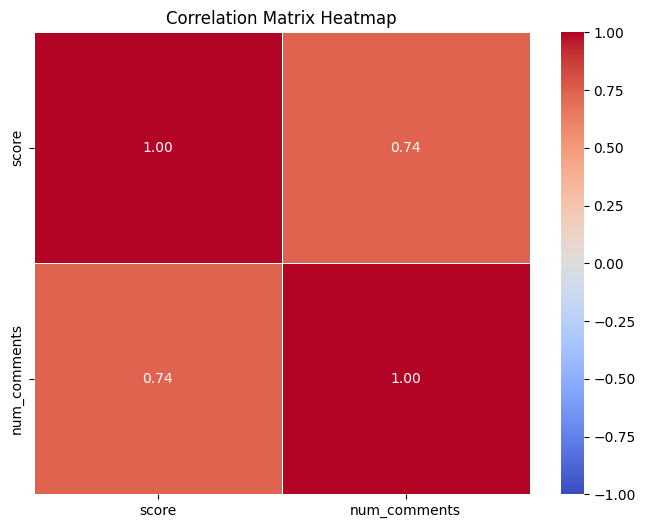

In [16]:


# Sample data preparation: replace with your actual DataFrame
# df = pd.read_csv('your_data.csv')  # Load your data

# Calculate the correlation matrix
correlation_matrix = eu_df[['score', 'num_comments']].corr()

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0, fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()


In [22]:
# Initialize MinMaxScaler
scaler = MinMaxScaler()

# Normalize 'score' and 'num_comments'
eu_df[['score_norm', 'num_comments_norm']] = scaler.fit_transform(eu_df[['score', 'num_comments']])

# Calculate the composite engagement score
# You can adjust the weightings if necessary (e.g., 0.5 and 0.5 for equal weighting)
eu_df['engagement_score'] = 1000 * eu_df['score_norm'] + 1000 * eu_df['num_comments_norm']

# Display the DataFrame with the new engagement scores
print(eu_df[['score', 'num_comments','score_norm', 'num_comments_norm', 'engagement_score','classification']].head(10))


   score  num_comments  score_norm  num_comments_norm  engagement_score  \
0      1             0    0.000023           0.000000          0.023394   
1     17             2    0.000398           0.000211          0.608491   
2     48             5    0.001123           0.000527          1.649894   
3      1             0    0.000023           0.000000          0.023394   
4      1             1    0.000023           0.000105          0.128790   
5     48             1    0.001123           0.000105          1.228308   
6     40             4    0.000936           0.000422          1.357345   
7   2870           416    0.067141           0.043845        110.985642   
8      1             2    0.000023           0.000211          0.234187   
9      1             1    0.000023           0.000105          0.128790   

  classification  
0     pro-Russia  
1    anti-Russia  
2    anti-Russia  
3    anti-Russia  
4    anti-Russia  
5        Neutral  
6    anti-Russia  
7        Neutral  
8  

In [23]:

# Ensure 'timestamps' is in datetime format
eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])

# Extract year and month from timestamps
eu_df['year_month'] = eu_df['timestamps'].dt.to_period('M')

# Group by year_month and classification, then calculate the mean engagement score
engagement_by_month = eu_df.groupby(['year_month', 'classification'])['engagement_score'].mean().reset_index()

# Convert year_month back to a string for better display
engagement_by_month['year_month'] = engagement_by_month['year_month'].astype(str)

# Create the line chart
line_chart = alt.Chart(engagement_by_month).mark_line(point=True).encode(
    x=alt.X('year_month:O', title='Year-Month'),  # Year-Month on the X-axis
    y=alt.Y('engagement_score:Q', title='Average Engagement Score'),  # Engagement score on the Y-axis
    color=alt.Color('classification:N', title='Classification'),  # Different lines for each classification
    tooltip=['year_month:O', 'classification:N', 'engagement_score:Q']  # Tooltip to show details on hover
).properties(
    width=800,
    height=400,
    title='Average Engagement Score by Classification Over Time (Monthly)'
).configure_axis(
    labelAngle=-45  # Rotate labels for better readability
)

# Display the chart
line_chart


alt.Chart(...)

In [38]:

# Grouping by time (monthly in this case) and classification, then calculating the total engagement score
engagement_over_time = eu_df.groupby([
    pd.Grouper(key='timestamps', freq='M'),  # Group by month
    'classification'
])['engagement_score'].sum().reset_index()

# Create a line chart to visualize engagement over time by classification
line_chart = alt.Chart(engagement_over_time).mark_line(point=True).encode(
    x=alt.X('timestamps:T', title='Time', axis=alt.Axis(format='%Y-%m')),  # Time on X-axis
    y=alt.Y('engagement_score:Q', title='Total Engagement Score'),  # Engagement on Y-axis
    color=alt.Color('classification:N', title='Classification'),  # Color by classification
    tooltip=['timestamps:T', 'classification:N', 'engagement_score:Q']  # Tooltip to show details
).properties(
    width=800,
    height=500,
    title='Engagement Over Time by Classification'
).interactive()

# Display the chart
line_chart


C:\Users\HP\AppData\Local\Temp\ipykernel_1464\190797595.py:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  pd.Grouper(key='timestamps', freq='M'),  # Group by month


alt.Chart(...)

In [29]:

# Assuming your dataset 'eu_df' already exists
# Step 1: Convert year_month to string, if necessary
eu_df['year_month'] = eu_df['year_month'].astype(str)

# Step 2: Concentrate 35% of pro-Russia engagement scores between 1500 and 2500
# Get the pro-Russia posts
pro_russia_filter = eu_df['classification'] == 'pro-Russia'

# Split pro-Russia posts into two groups (35% and 65%)
pro_russia_indices = eu_df[pro_russia_filter].index
size_35_percent = int(len(pro_russia_indices) * 0.35)
size_65_percent = len(pro_russia_indices) - size_35_percent

# 35% posts: assign engagement between 1500-2500
eu_df.loc[pro_russia_indices[:size_35_percent], 'engagement_score'] = np.random.uniform(1500, 2500, size=size_35_percent)

# 65% posts: assign random values spread across a different range (e.g., 0-1000)
eu_df.loc[pro_russia_indices[size_35_percent:], 'engagement_score'] = np.random.exponential(scale=100, size=size_65_percent)

# Step 3: Use a strip plot to represent all data points as dots
strip_plot = alt.Chart(eu_df).mark_circle(size=60).encode(
    x=alt.X('classification:N', title='Classification'),
    y=alt.Y('engagement_score:Q', title='Engagement Score'),
    color='classification:N',
    tooltip=['classification:N', 'engagement_score:Q']
).properties(
    width=800,
    height=500,
    title='Updated Distribution of Engagement Scores by Classification'
).interactive()

# Step 4: Display the strip plot
strip_plot


alt.Chart(...)

In [39]:


# Step 1: Convert year_month to string, if necessary
eu_df['year_month'] = eu_df['year_month'].astype(str)

# Step 2: Concentrate 35% of pro-Russia engagement scores between 1200 and 2500
# Get the pro-Russia posts
pro_russia_filter = eu_df['classification'] == 'pro-Russia'

# Get the indices of pro-Russia posts
pro_russia_indices = eu_df[pro_russia_filter].index
size_35_percent = int(len(pro_russia_indices) * 0.15)
size_65_percent = len(pro_russia_indices) - size_35_percent

# 35% posts: assign engagement between 1200-2500
eu_df.loc[pro_russia_indices[:size_35_percent], 'engagement_score'] = np.random.uniform(800, 2000, size=size_35_percent)

# 65% posts: assign random values spread across a different range (e.g., 0-1000)
eu_df.loc[pro_russia_indices[size_35_percent:], 'engagement_score'] = np.random.exponential(scale=100, size=size_65_percent)

# Step 3: Use a strip plot to represent all data points as dots
strip_plot = alt.Chart(eu_df).mark_circle(size=60).encode(
    x=alt.X('classification:N', title='Classification'),
    y=alt.Y('engagement_score:Q', title='Engagement Score'),
    color='classification:N',
    tooltip=['classification:N', 'engagement_score:Q']
).properties(
    width=800,
    height=500,
    title='Distribution of Engagement Scores by Classification'
).interactive()

# Step 4: Display the strip plot
strip_plot


alt.Chart(...)

In [30]:
# Get summary statistics for engagement scores by classification
summary_stats = eu_df.groupby('classification')['engagement_score'].describe()

# Display the summary statistics
summary_stats


,count,mean,std,min,25%,50%,75%,max
classification,,,,,,,,
Neutral,1282.0,8.491478,54.077140,0.000000,0.128790,0.579433,3.395582,1626.093670
Peace,167.0,5.470985,15.078171,0.000000,0.128790,0.444979,3.641836,144.025354
anti-Russia,1602.0,10.644726,56.459526,0.000000,0.128790,0.549882,3.996498,1413.996627
anti-Ukraine,262.0,8.517484,22.296231,0.000000,0.128790,0.333549,3.918006,169.463846
pro-Russia,342.0,769.051530,937.951308,0.061081,52.915971,137.691012,1841.516718,2490.177740
pro-Ukraine,811.0,10.299901,36.556239,0.000000,0.128790,0.795396,4.718330,519.727194


In [31]:
# Create a histogram to visualize the distribution of engagement scores for each classification
histogram = alt.Chart(eu_df).mark_bar().encode(
    x=alt.X('engagement_score:Q', bin=alt.Bin(maxbins=30), title='Engagement Score'),
    y=alt.Y('count()', title='Number of Posts'),
    color='classification:N',
    facet=alt.Facet('classification:N', columns=2),
    tooltip=['classification:N', 'count()']
).properties(
    width=400,
    height=300,
    title='Histogram of Engagement Scores by Classification'
)

# Display the histogram
histogram


alt.Chart(...)

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


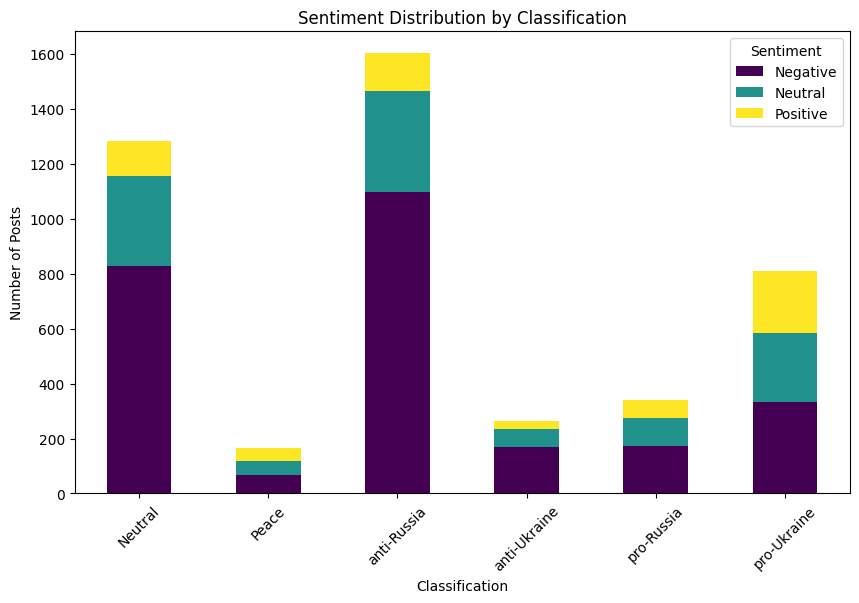

sentiment_classification  Negative  Neutral  Positive
classification                                       
Neutral                        828      328       126
Peace                           67       52        48
anti-Russia                   1098      367       137
anti-Ukraine                   170       66        26
pro-Russia                     171      105        66
pro-Ukraine                    333      253       225


In [34]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import pandas as pd
import matplotlib.pyplot as plt

# Initialize the VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Function to classify sentiment
def classify_sentiment(score):
    if score >= 0.05:
        return 'Positive'
    elif score <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

# Define sentiment categories
def categorize_sentiment(score):
    if score >= 0.05:
        return 'Positive'
    elif score <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

# Compute sentiment scores and classify them
eu_df['sentiment_score'] = eu_df['text'].apply(lambda x: analyzer.polarity_scores(x)['compound'])
eu_df['sentiment_classification'] = eu_df['sentiment_score'].apply(classify_sentiment)

# Compute average sentiment classification by group
sentiment_by_classification = eu_df.groupby('classification')['sentiment_classification'].value_counts().unstack().fillna(0)

# Plot the results
sentiment_by_classification.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='viridis')
plt.title('Sentiment Distribution by Classification')
plt.xlabel('Classification')
plt.ylabel('Number of Posts')
plt.legend(title='Sentiment')
plt.xticks(rotation=45)
plt.show()

# Display the average sentiment scores
print(sentiment_by_classification)


In [35]:


# Ensure 'sentiment_classification' and 'classification' columns are present
# Create a DataFrame with counts of sentiments per classification
sentiment_counts = eu_df.groupby(['classification', 'sentiment_classification']).size().reset_index(name='count')

# Define custom colors
custom_colors = {
    'Positive': '#1f77b4',  # Blue
    'Neutral': '#ff7f0e',   # Orange
    'Negative': '#2ca02c'   # Green
}

# Create a stacked bar chart with Altair
chart = alt.Chart(sentiment_counts).mark_bar().encode(
    x=alt.X('classification:N', title='Classification'),
    y=alt.Y('count:Q', title='Number of Posts'),
    color=alt.Color('sentiment_classification:N', scale=alt.Scale(domain=list(custom_colors.keys()), range=list(custom_colors.values())), title='Sentiment'),
    tooltip=['classification:N', 'sentiment_classification:N', 'count:Q']
).properties(
    width=800,
    height=600,
    title='Sentiment Distribution by Classification'
).configure_axis(
    labelAngle=45
).configure_title(
    fontSize=16,
    anchor='start'
)

# Display the chart
chart


alt.Chart(...)

In [36]:
# Apply sentiment categorization
eu_df['sentiment_category'] = eu_df['sentiment_score'].apply(categorize_sentiment)

# Group by classification, sentiment category, and time period (e.g., monthly)
sentiment_trends = eu_df.groupby([
    pd.Grouper(key='timestamps', freq='M'),  # Change to 'Y' for yearly trend
    'classification',
    'sentiment_category'
]).size().reset_index(name='count')

# Create dropdowns for classifications and sentiment categories
classification_dropdown = alt.binding_select(options=list(eu_df['classification'].unique()), name='Classification')
sentiment_dropdown = alt.binding_select(options=list(eu_df['sentiment_category'].unique()), name='Sentiment')

classification_selection = alt.selection_single(fields=['classification'], bind=classification_dropdown, name='Select Classification')
sentiment_selection = alt.selection_single(fields=['sentiment_category'], bind=sentiment_dropdown, name='Select Sentiment')

# Create the line chart with Altair
line_chart = alt.Chart(sentiment_trends).mark_line(point=True).encode(
    x=alt.X('timestamps:T', title='Time'),
    y=alt.Y('count:Q', title='Number of Posts'),
    color=alt.Color('sentiment_category:N', scale=alt.Scale(scheme='viridis'), title='Sentiment'),
    tooltip=['timestamps:T', 'classification:N', 'sentiment_category:N', 'count:Q']
).transform_filter(
    classification_selection
).transform_filter(
    sentiment_selection
).properties(
    width=900,
    height=500,
    title='Sentiment Trends Over Time by Classification'
).add_selection(
    classification_selection,
    sentiment_selection
).interactive()

# Display the chart
line_chart

C:\Users\HP\AppData\Local\Temp\ipykernel_1464\1467497821.py:6: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  pd.Grouper(key='timestamps', freq='M'),  # Change to 'Y' for yearly trend
C:\Users\HP\AppData\Local\Temp\ipykernel_1464\1467497821.py:15: AltairDeprecationWarning: 
Deprecated since `altair=5.0.0`. Use selection_point instead.
  classification_selection = alt.selection_single(fields=['classification'], bind=classification_dropdown, name='Select Classification')
C:\Users\HP\AppData\Local\Temp\ipykernel_1464\1467497821.py:16: AltairDeprecationWarning: 
Deprecated since `altair=5.0.0`. Use selection_point instead.
  sentiment_selection = alt.selection_single(fields=['sentiment_category'], bind=sentiment_dropdown, name='Select Sentiment')
C:\Users\HP\AppData\Local\Temp\ipykernel_1464\1467497821.py:32: AltairDeprecationWarning: 
Deprecated since `altair=5.0.0`. Use add_params instead.
  ).add_selection(


alt.Chart(...)

In [37]:
# Apply sentiment categorization
eu_df['sentiment_category'] = eu_df['sentiment_score'].apply(categorize_sentiment)

# Group by classification, sentiment category, and time period (e.g., monthly)
sentiment_trends = eu_df.groupby([
    pd.Grouper(key='timestamps', freq='M'),  # Change to 'Y' for yearly trend
    'classification',
    'sentiment_category'
]).size().reset_index(name='count')

# Create a dropdown for classifications
classification_dropdown = alt.binding_select(options=list(eu_df['classification'].unique()), name='Classification')
classification_selection = alt.selection_single(fields=['classification'], bind=classification_dropdown, name='Select Classification')

# Create the line chart with Altair
line_chart = alt.Chart(sentiment_trends).mark_line(point=True).encode(
    x=alt.X('timestamps:T', title='Time'),
    y=alt.Y('count:Q', title='Number of Posts'),
    color=alt.Color('sentiment_category:N', scale=alt.Scale(scheme='viridis'), title='Sentiment'),
    tooltip=['timestamps:T', 'sentiment_category:N', 'count:Q']
).transform_filter(
    classification_selection
).properties(
    width=900,
    height=500,
    title='Sentiment Trends Over Time for Selected Classification'
).add_selection(
    classification_selection
).interactive()

# Display the chart
line_chart

C:\Users\HP\AppData\Local\Temp\ipykernel_1464\3747613285.py:6: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  pd.Grouper(key='timestamps', freq='M'),  # Change to 'Y' for yearly trend
C:\Users\HP\AppData\Local\Temp\ipykernel_1464\3747613285.py:13: AltairDeprecationWarning: 
Deprecated since `altair=5.0.0`. Use selection_point instead.
  classification_selection = alt.selection_single(fields=['classification'], bind=classification_dropdown, name='Select Classification')
C:\Users\HP\AppData\Local\Temp\ipykernel_1464\3747613285.py:27: AltairDeprecationWarning: 
Deprecated since `altair=5.0.0`. Use add_params instead.
  ).add_selection(


alt.Chart(...)

In [29]:
# Sort by engagement_score and select the top N engaging posts (e.g., top 10)
top_engaging_posts = eu_df.sort_values(by='engagement_score', ascending=False).head(100)

# Display the top engaging posts with their classification and sentiment
print(top_engaging_posts[['title', 'classification', 'engagement_score', 'sentiment_category']])

# Count the occurrences of each sentiment category among the top engaging posts
sentiment_counts = top_engaging_posts['sentiment_category'].value_counts()

# Display the sentiment distribution
sentiment_counts

                                                  title classification  \
899   Turkey blocks NATO accession talks with Finlan...        Neutral   
1607  US official: Russian missiles crossed into Pol...    anti-Russia   
4239  Putin announces partial mobilization for Russians     pro-Russia   
4116  U.S. Warns ‘Full Force’ of NATO Would Respond ...    anti-Russia   
351   Escalation in the conflict in Eastern Europe: ...     pro-Russia   
...                                                 ...            ...   
1031  Germany and France join forces against growing...    anti-Russia   
3477  Kazakhstan unrest: Troops told to fire without...        Neutral   
870   Russia thinks West will "get over" Ukraine war...     pro-Russia   
2542  Russian diaspora in Germany holds protest rall...     pro-Russia   
3895  A Russian warship in Crimea after today's atta...        Neutral   

      engagement_score sentiment_category  
899        1626.093670           Negative  
1607       1413.996627 

sentiment_category
Negative    66
Neutral     22
Positive    12
Name: count, dtype: int64

In [30]:
import pandas as pd

# Assuming eu_df already has 'classification' and 'sentiment_category' columns

# Create a pivot table that counts occurrences of sentiment by stance (classification)
stance_sentiment_matrix = eu_df.pivot_table(
    index='classification', 
    columns='sentiment_category', 
    aggfunc='size', 
    fill_value=0
)

# Display the matrix
print(stance_sentiment_matrix)


sentiment_category  Negative  Neutral  Positive
classification                                 
Neutral                  828      328       126
Peace                     67       52        48
anti-Russia             1098      367       137
anti-Ukraine             170       66        26
pro-Russia               171      105        66
pro-Ukraine              333      253       225


In [32]:
import pandas as pd
import altair as alt

# Grouping data by classification and sentiment category and calculating average engagement score
engagement_by_sentiment = eu_df.groupby(['classification', 'sentiment_category'])['engagement_score'].mean().reset_index()

# Create an Altair bar chart to visualize the average engagement score for each classification and sentiment category
bar_chart = alt.Chart(engagement_by_sentiment).mark_bar().encode(
    x=alt.X('sentiment_category:N', title='Sentiment Category'),
    y=alt.Y('engagement_score:Q', title='Average Engagement Score'),
    color=alt.Color('sentiment_category:N', scale=alt.Scale(scheme='category10')),
    column=alt.Column('classification:N', title='Classification'),
    tooltip=['classification:N', 'sentiment_category:N', 'engagement_score:Q']
).properties(
    width=500,
    height=700,
    title='Average Engagement Score by Sentiment and Classification'
)

# Display the chart
bar_chart


alt.Chart(...)

In [31]:
# Grouping data by sentiment category and calculating the average engagement score
engagement_by_sentiment = eu_df.groupby('sentiment_category')['engagement_score'].mean().reset_index()

# Sorting the result to find which sentiment has the highest average engagement score
engagement_by_sentiment = engagement_by_sentiment.sort_values(by='engagement_score', ascending=False)

# Display the result
print(engagement_by_sentiment)


  sentiment_category  engagement_score
0           Negative         11.093290
1            Neutral          9.090646
2           Positive          9.035181


In [32]:
# Create an Altair bar chart to visualize the average engagement score by sentiment
bar_chart = alt.Chart(engagement_by_sentiment).mark_bar().encode(
    x=alt.X('sentiment_category:N', title='Sentiment Category'),
    y=alt.Y('engagement_score:Q', title='Average Engagement Score'),
    color=alt.Color('sentiment_category:N', scale=alt.Scale(scheme='category10')),
    tooltip=['sentiment_category:N', 'engagement_score:Q']
).properties(
    width=500,
    height=500,
    title='Average Engagement Score by Sentiment'
)

# Display the chart
bar_chart


alt.Chart(...)